The link to get [ImageAnalysis3](https://github.com/zhengpuas47/ImageAnalysis3) 

or the Zhuang lab archived [source_tools](https://github.com/ZhuangLab/Chromatin_Analysis_2020_cell/tree/master/sequential_tracing/source)

In [1]:
%run C:/Users/cosmosyw/Documents/Softwares/DNA_MERFISH_analysis/Startup.py
    
import DNA_MERFISH_analysis

PID number is 27816



This notebook can be used to generate data that be can be found in the repository as using ATAC data:

[pc_correlation_summary](../4_compartment_analysis/resources/pc_correlation_summary.csv)

[pc_correlation_summary_Endo](../4_compartment_analysis/resources/pc_correlation_summary_Endo.csv)

[pc_manual_assign_AB](../4_compartment_analysis/resources/pc_manual_assign_AB.csv)


Alternatively, pc values can be calcualted using the codebook as:

[3_ab_compartment_calculation_and_pca_analysis](3_ab_compartment_calculation_and_pca_analysis.ipynb)

# Load correlation maps and define important parameters

In [2]:
dict_corrmaps = pickle.load(open(r"E:\DNA_analysis\Postanalysis_WT_MoP\majorType_norm_pc1_all_info.pkl", 'rb'))

In [3]:
majortypes = np.array(['Gluta', 'GABA', 'Astro', 'Oligo', 'Micro', 'Endo'])
chroms = []
for i in range(1,20):
    chroms.append('chr'+str(i))
chroms.append('chrX')
chroms = np.array(chroms)

In [4]:
df_mCH = pd.read_csv(r"C:\Users\cosmosyw\Documents\resources\methyl\mCH_fraction_majorType_1Mb.csv")
df_mCG = pd.read_csv(r"C:\Users\cosmosyw\Documents\resources\methyl\mCG_fraction_majorType_1Mb.csv")
df_RNA = pd.read_csv(r"C:\Users\cosmosyw\Documents\resources\snATAC_snRNA\RNA_expression_majorType_2Mb.csv")
df_ATAC = pd.read_csv(r"C:\Users\cosmosyw\Documents\resources\snATAC_snRNA\snATAC_majorType_2Mb.csv")

# Run PCA and plot two PCs

In [5]:
from DNA_MERFISH_analysis.plot_tools import matrix_plot
from sklearn.decomposition import PCA
from scipy.stats import pearsonr, pointbiserialr

Imported necessary basic parameters and libraries for plotting


In [6]:
figure_folder = r'E:\DNA_analysis\Postanalysis_WT_MoP\AB_calling_twoPCs\Figures'
if not os.path.exists(figure_folder):
    os.mkdir(figure_folder)

In [7]:
df_compartment_pc = pd.read_csv(r"E:\DNA_analysis\Postanalysis_WT_MoP\AB_calling_twoPCs\pc_manual_assign_AB.csv")
df_compartment_pc.head()

,majorType,chr,compartment_pc
0,Astro,chr1,2
1,Astro,chr10,1
2,Astro,chr11,1
3,Astro,chr12,1
4,Astro,chr13,1


def calculate_num_of_compartments(pc):
    pc_sign_switch = pc[:-1] * pc[1:]
    return len(np.where(pc_sign_switch<0)[0])

In [8]:
def determine_sign_switching_for_compartment_pc(norm_pc, epigenetic_info):
    # the epigenetic info for mCH and mCG should be taken as negative to have similar comparison scale as snATAC and RNA
    positive_pc = np.average(epigenetic_info[norm_pc>0])
    negative_pc = np.average(epigenetic_info[norm_pc<0])
    return negative_pc>positive_pc

def determine_sign_switching_for_non_compartment_pc(pc, compartment_pc):
    total_num = len(pc)
    total_num_sign_conserving = len(np.where(pc*compartment_pc>0)[0])
    return total_num_sign_conserving<(total_num/2)

In [9]:
dict_pc_corr_info = {}
dict_pc_corr_info['majorType'] = []
dict_pc_corr_info['chr'] = []
dict_pc_corr_info['pc1'] = []
dict_pc_corr_info['pc2'] = []
dict_pc_corr_info['pc1_mCH_p'] = []
dict_pc_corr_info['pc1_mCH_r'] = []
dict_pc_corr_info['pc1_mCG_p'] = []
dict_pc_corr_info['pc1_mCG_r'] = []
dict_pc_corr_info['pc2_mCH_p'] = []
dict_pc_corr_info['pc2_mCH_r'] = []
dict_pc_corr_info['pc2_mCG_p'] = []
dict_pc_corr_info['pc2_mCG_r'] = []
dict_pc_corr_info['pc1_RNA_p'] = []
dict_pc_corr_info['pc1_RNA_r'] = []
dict_pc_corr_info['pc1_ATAC_p'] = []
dict_pc_corr_info['pc1_ATAC_r'] = []
dict_pc_corr_info['pc2_RNA_p'] = []
dict_pc_corr_info['pc2_RNA_r'] = []
dict_pc_corr_info['pc2_ATAC_p'] = []
dict_pc_corr_info['pc2_ATAC_r'] = []
dict_pc_corr_info['pc1_explained_ratio'] = []
dict_pc_corr_info['pc2_explained_ratio'] = []

meta NOT subset; don't know how to subset; dropped


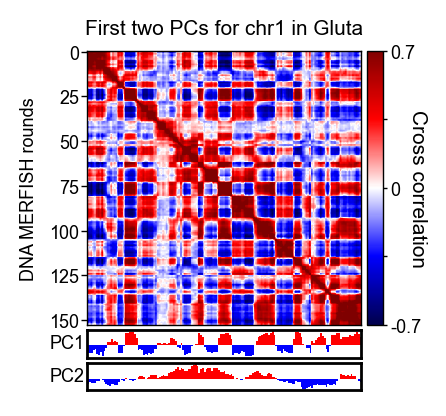

meta NOT subset; don't know how to subset; dropped


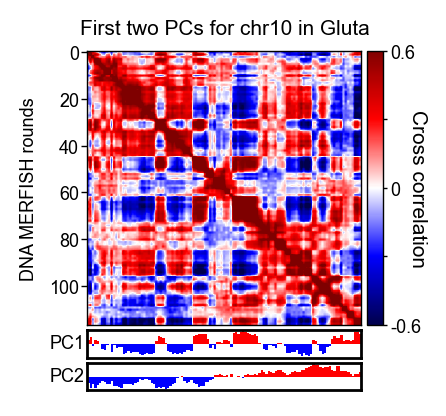

meta NOT subset; don't know how to subset; dropped


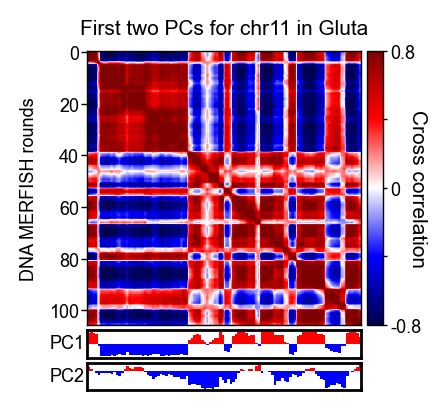

meta NOT subset; don't know how to subset; dropped


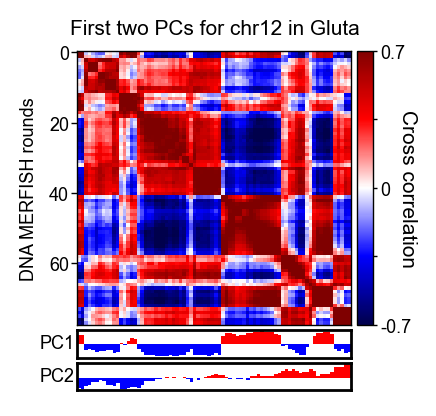

meta NOT subset; don't know how to subset; dropped


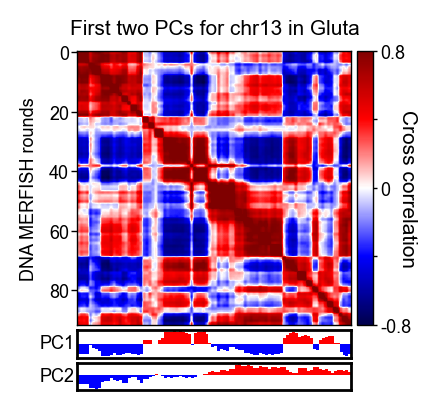

meta NOT subset; don't know how to subset; dropped


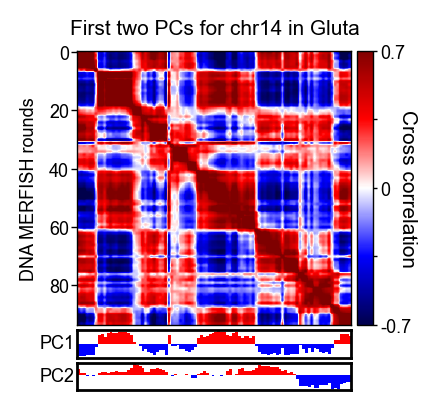

meta NOT subset; don't know how to subset; dropped


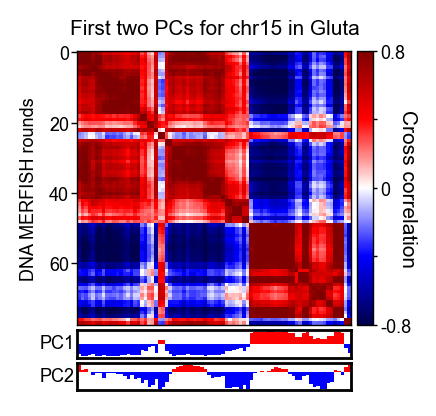

meta NOT subset; don't know how to subset; dropped


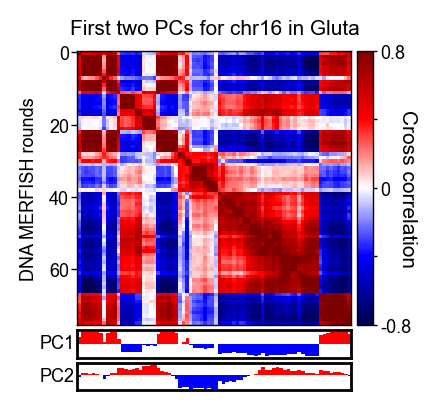

meta NOT subset; don't know how to subset; dropped


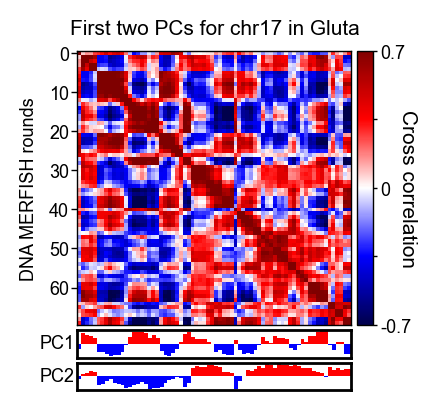

meta NOT subset; don't know how to subset; dropped


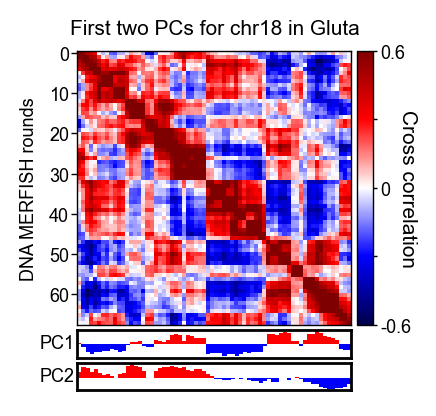

meta NOT subset; don't know how to subset; dropped


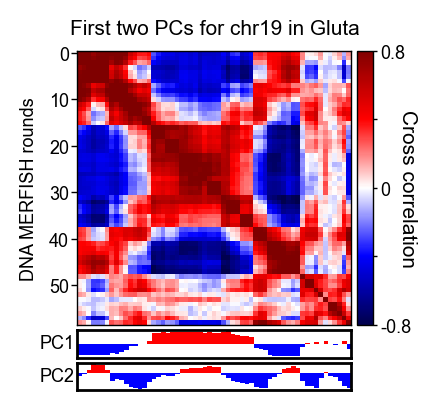

meta NOT subset; don't know how to subset; dropped


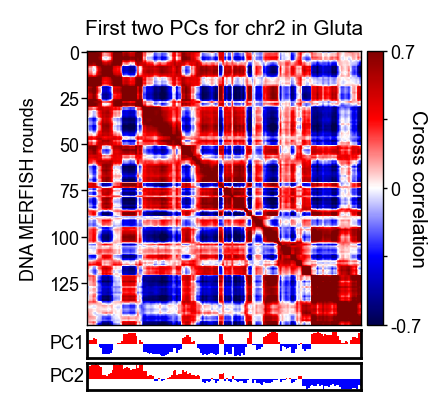

meta NOT subset; don't know how to subset; dropped


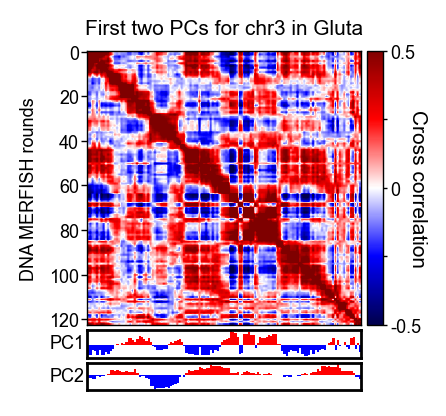

meta NOT subset; don't know how to subset; dropped


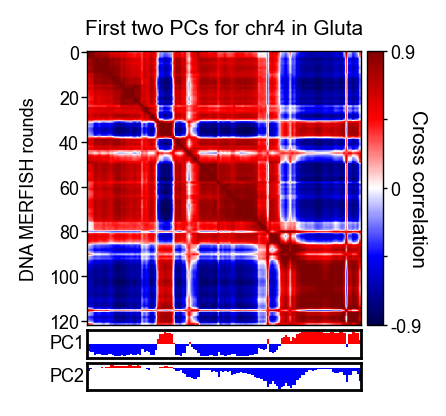

meta NOT subset; don't know how to subset; dropped


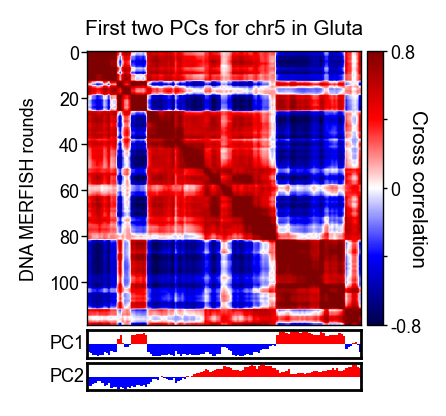

meta NOT subset; don't know how to subset; dropped


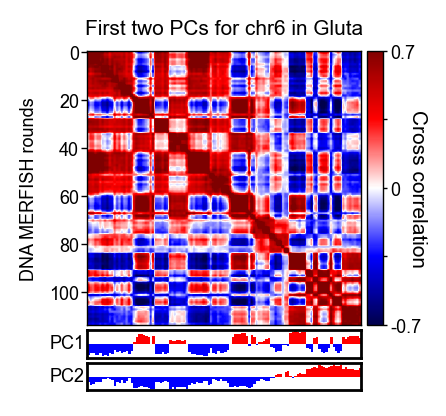

meta NOT subset; don't know how to subset; dropped


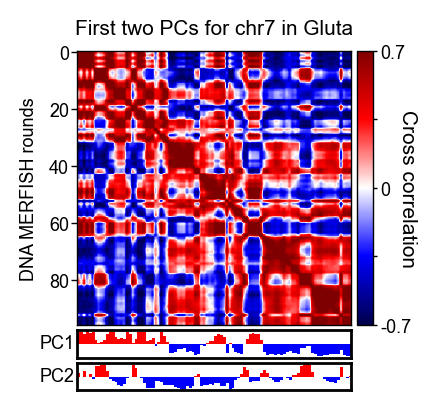

meta NOT subset; don't know how to subset; dropped


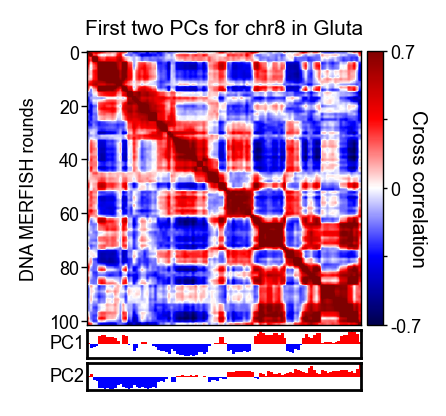

meta NOT subset; don't know how to subset; dropped


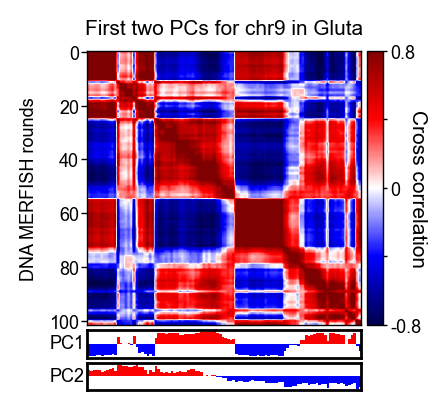

meta NOT subset; don't know how to subset; dropped


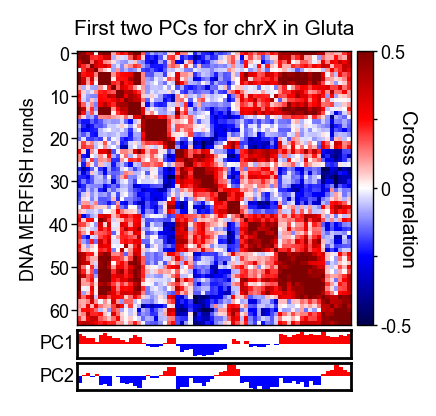

meta NOT subset; don't know how to subset; dropped


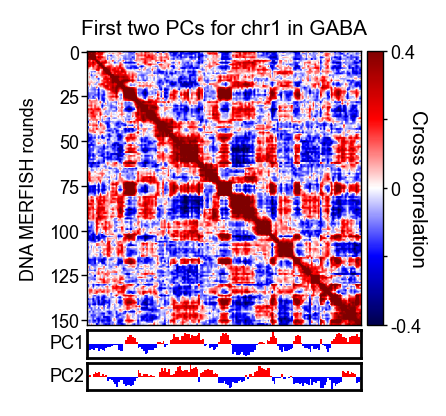

meta NOT subset; don't know how to subset; dropped


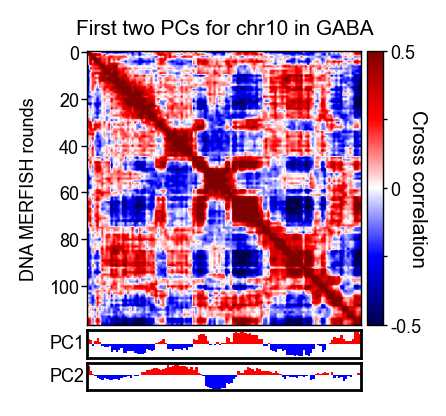

meta NOT subset; don't know how to subset; dropped


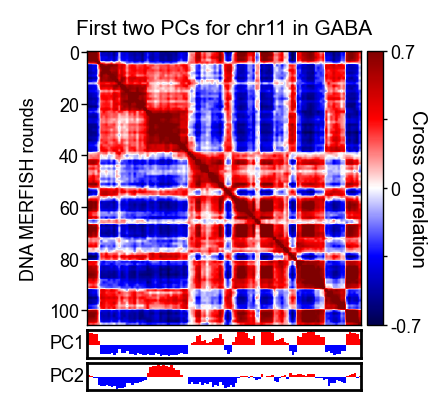

meta NOT subset; don't know how to subset; dropped


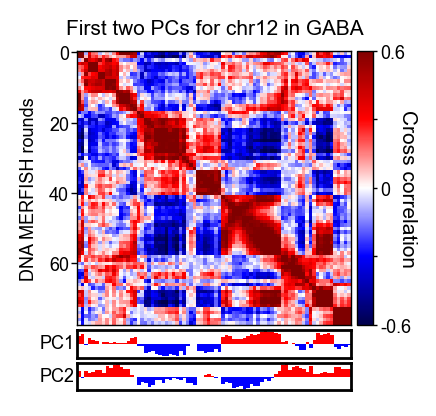

meta NOT subset; don't know how to subset; dropped


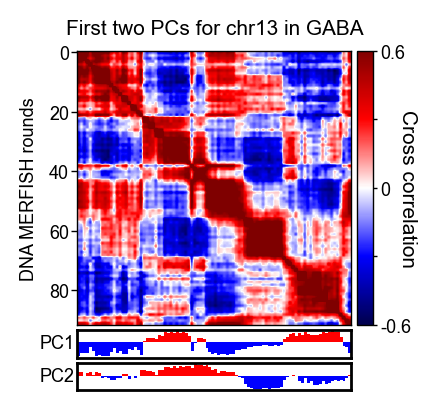

meta NOT subset; don't know how to subset; dropped


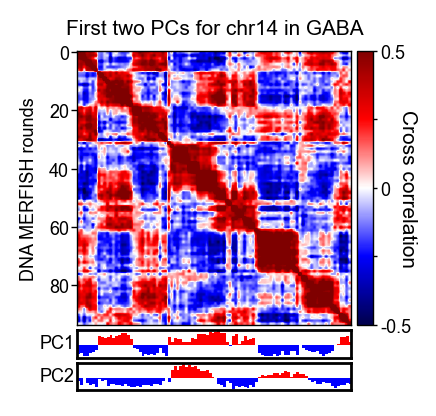

meta NOT subset; don't know how to subset; dropped


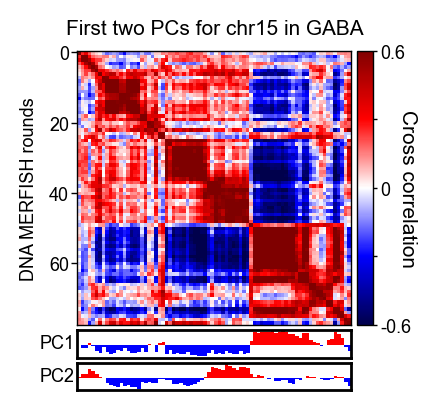

meta NOT subset; don't know how to subset; dropped


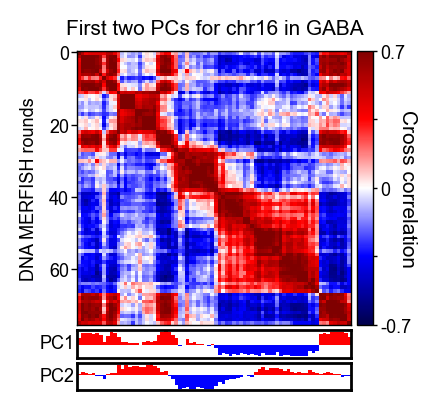

meta NOT subset; don't know how to subset; dropped


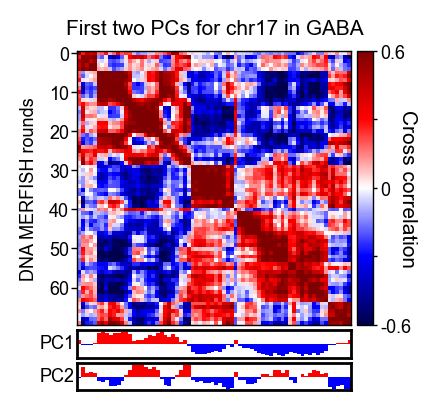

meta NOT subset; don't know how to subset; dropped


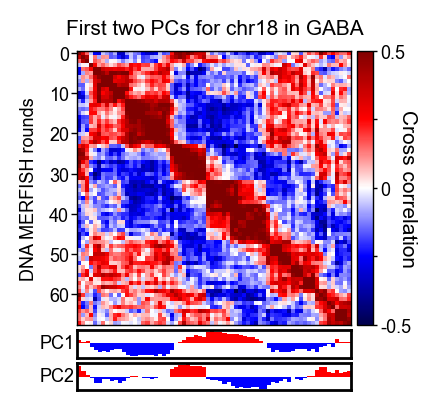

meta NOT subset; don't know how to subset; dropped


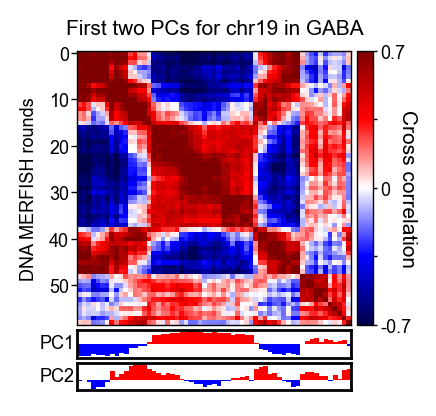

meta NOT subset; don't know how to subset; dropped


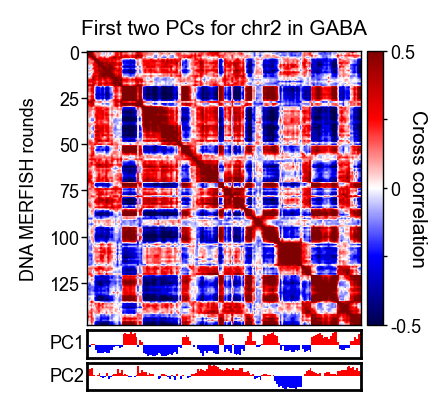

meta NOT subset; don't know how to subset; dropped


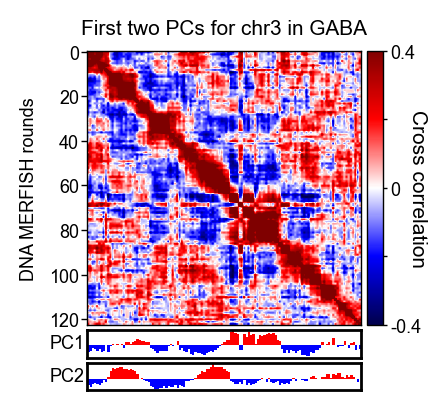

meta NOT subset; don't know how to subset; dropped


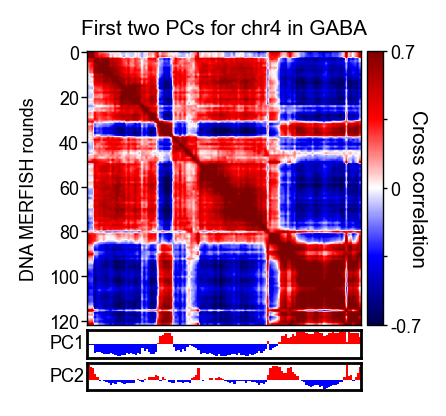

meta NOT subset; don't know how to subset; dropped


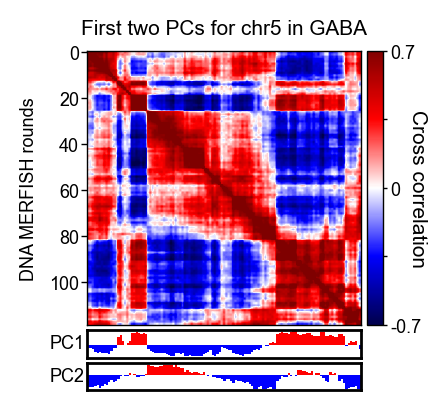

meta NOT subset; don't know how to subset; dropped


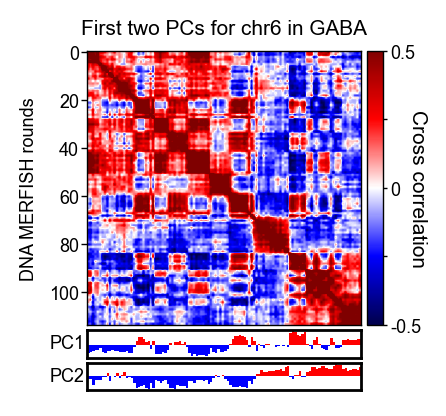

meta NOT subset; don't know how to subset; dropped


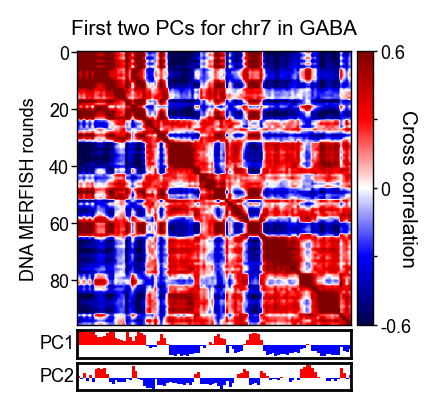

meta NOT subset; don't know how to subset; dropped


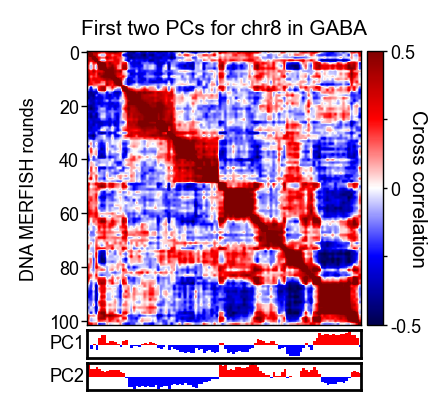

meta NOT subset; don't know how to subset; dropped


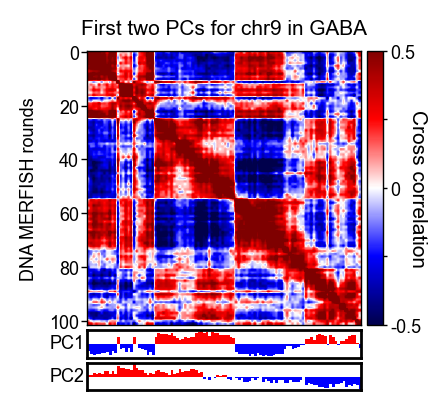

meta NOT subset; don't know how to subset; dropped


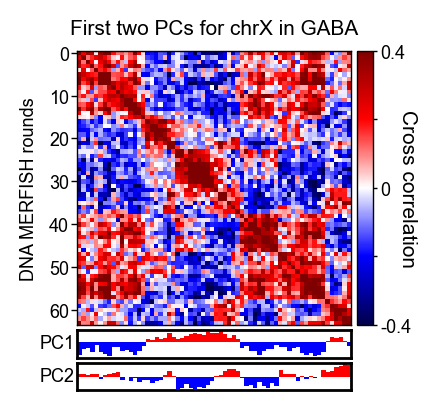

meta NOT subset; don't know how to subset; dropped


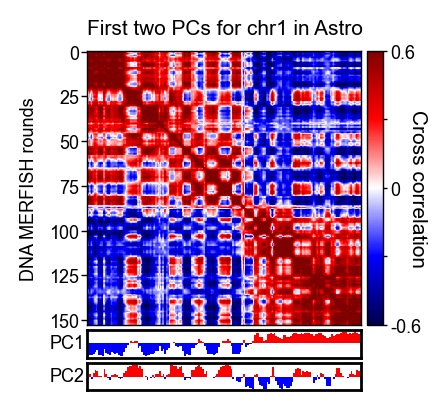

meta NOT subset; don't know how to subset; dropped


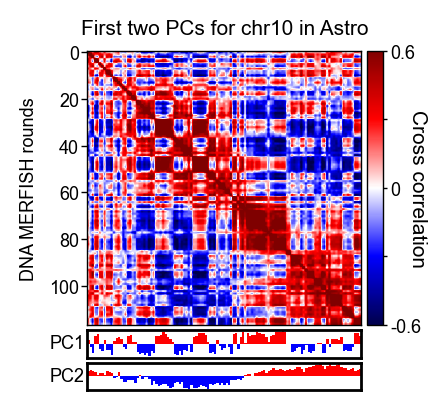

meta NOT subset; don't know how to subset; dropped


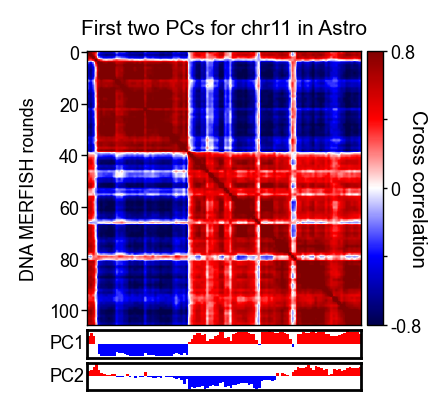

meta NOT subset; don't know how to subset; dropped


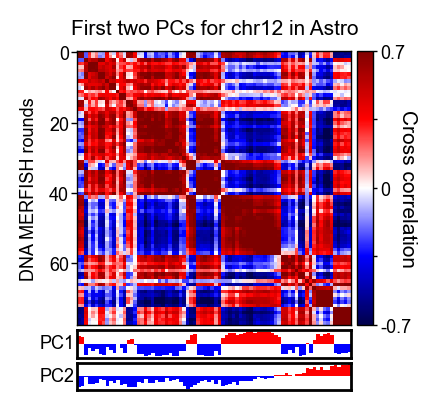

meta NOT subset; don't know how to subset; dropped


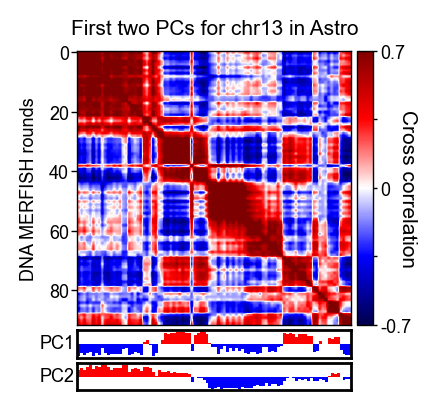

meta NOT subset; don't know how to subset; dropped


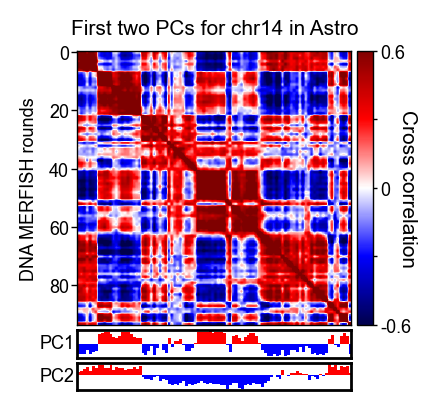

meta NOT subset; don't know how to subset; dropped


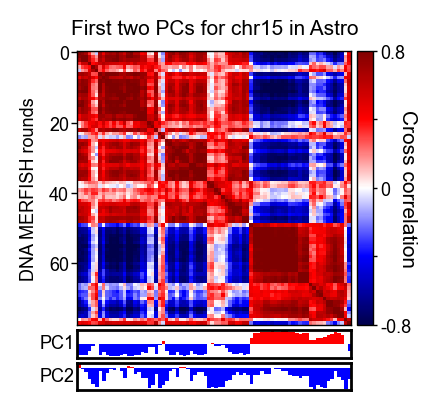

meta NOT subset; don't know how to subset; dropped


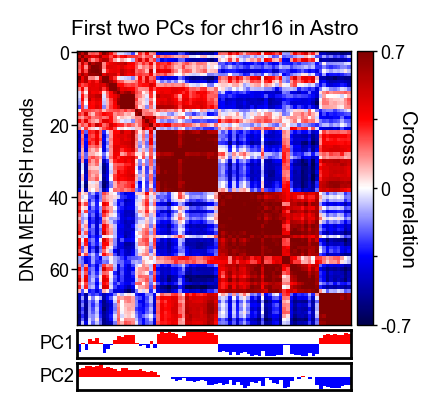

meta NOT subset; don't know how to subset; dropped


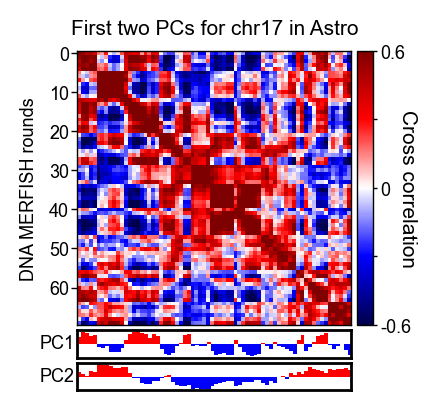

meta NOT subset; don't know how to subset; dropped


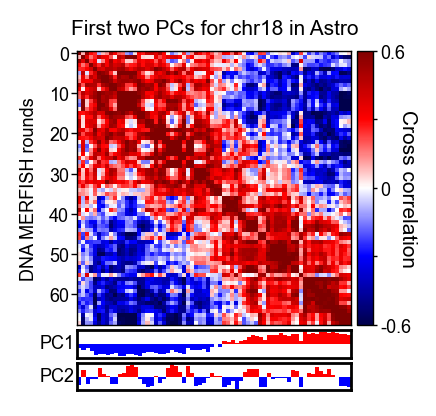

meta NOT subset; don't know how to subset; dropped


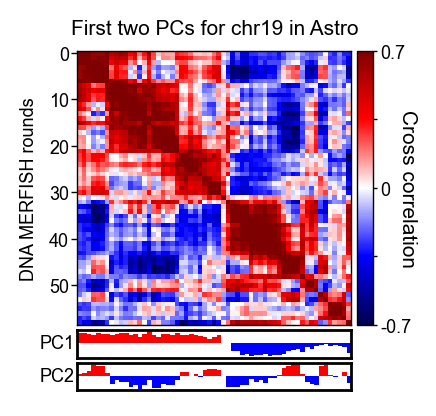

meta NOT subset; don't know how to subset; dropped


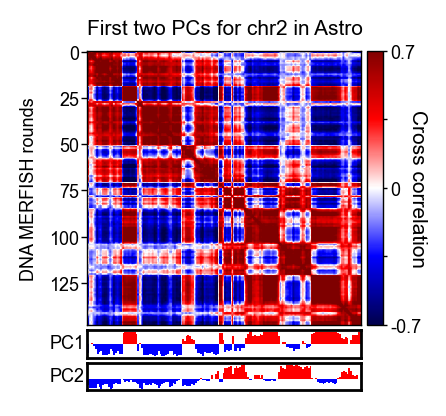

meta NOT subset; don't know how to subset; dropped


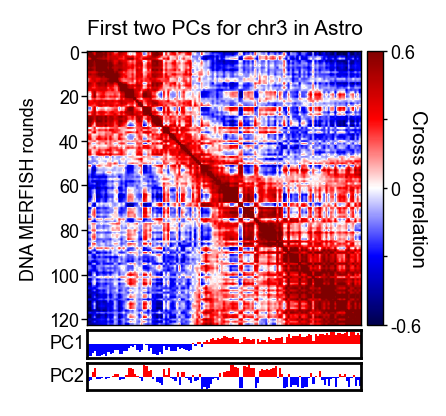

meta NOT subset; don't know how to subset; dropped


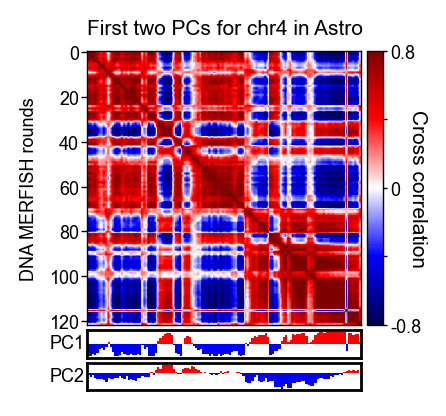

meta NOT subset; don't know how to subset; dropped


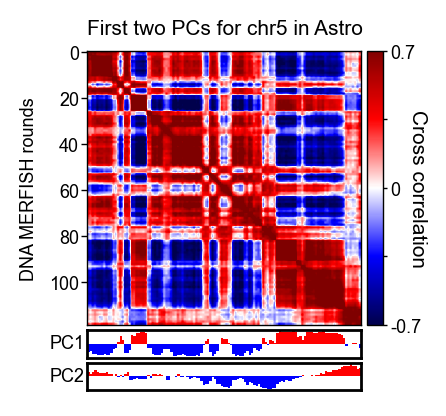

meta NOT subset; don't know how to subset; dropped


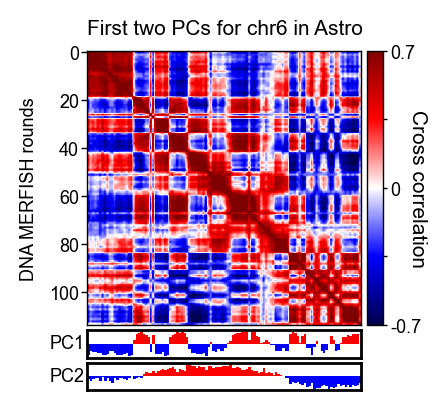

meta NOT subset; don't know how to subset; dropped


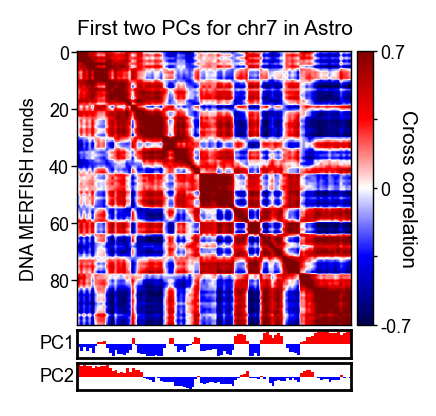

meta NOT subset; don't know how to subset; dropped


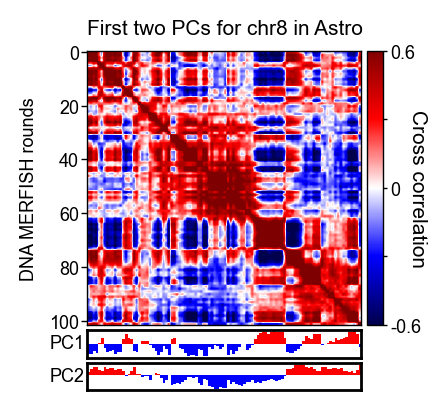

meta NOT subset; don't know how to subset; dropped


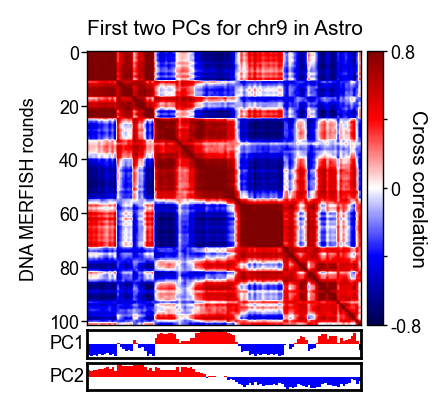

meta NOT subset; don't know how to subset; dropped


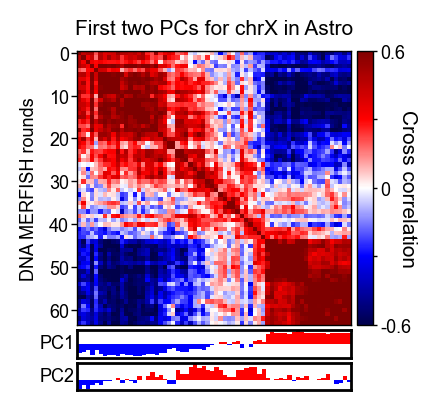

meta NOT subset; don't know how to subset; dropped


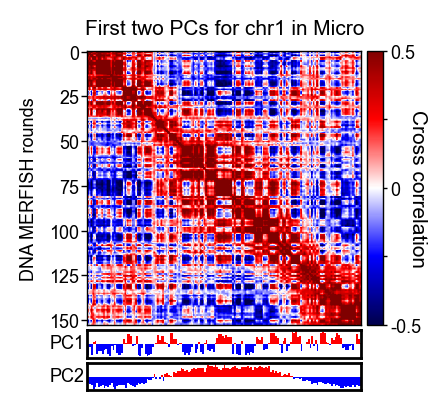

meta NOT subset; don't know how to subset; dropped


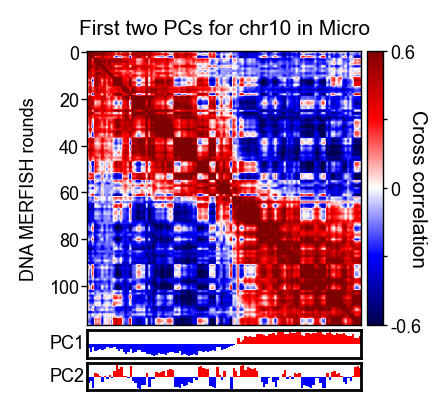

meta NOT subset; don't know how to subset; dropped


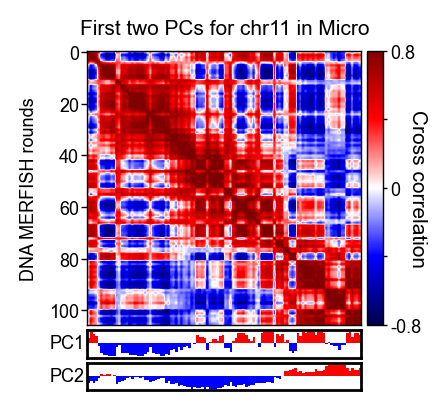

meta NOT subset; don't know how to subset; dropped


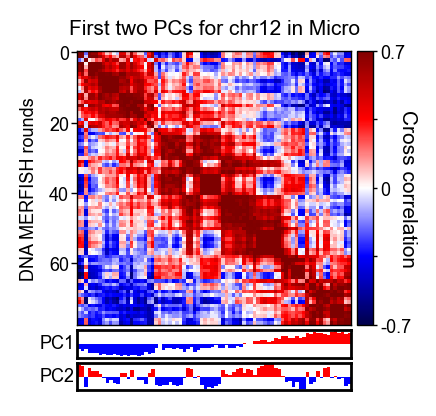

meta NOT subset; don't know how to subset; dropped


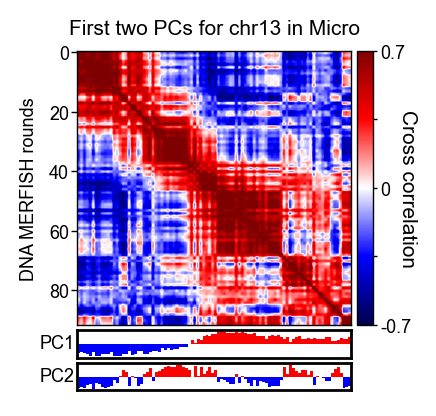

meta NOT subset; don't know how to subset; dropped


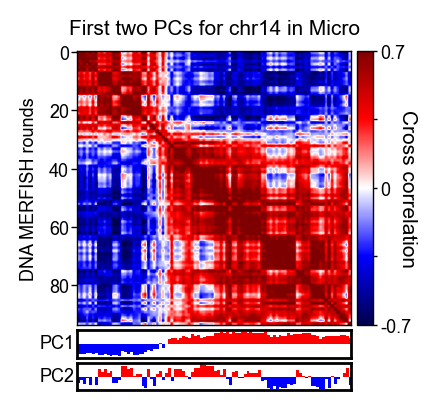

meta NOT subset; don't know how to subset; dropped


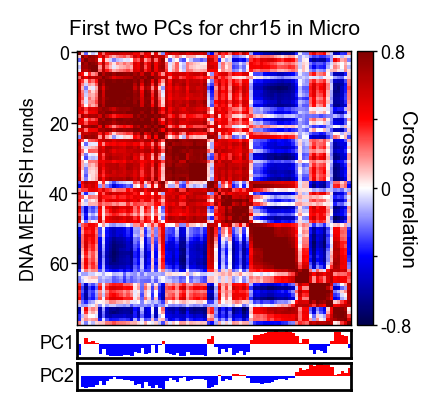

meta NOT subset; don't know how to subset; dropped


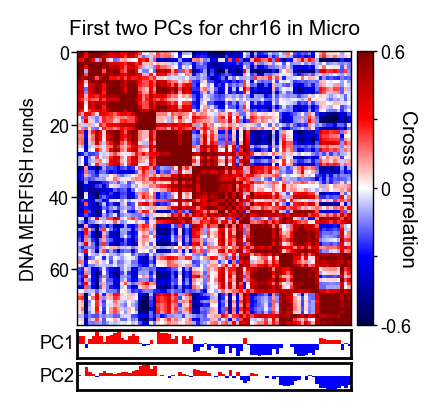

meta NOT subset; don't know how to subset; dropped


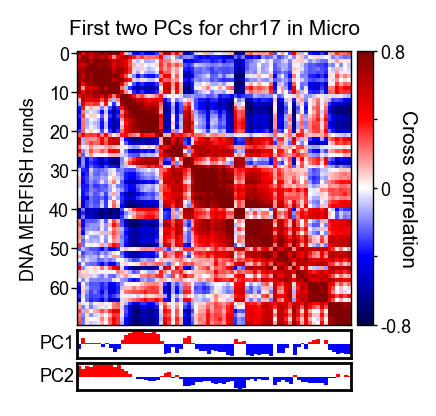

meta NOT subset; don't know how to subset; dropped


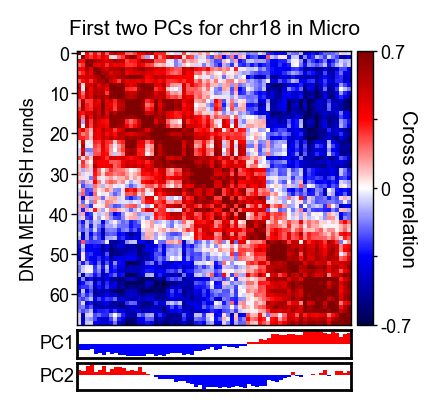

meta NOT subset; don't know how to subset; dropped


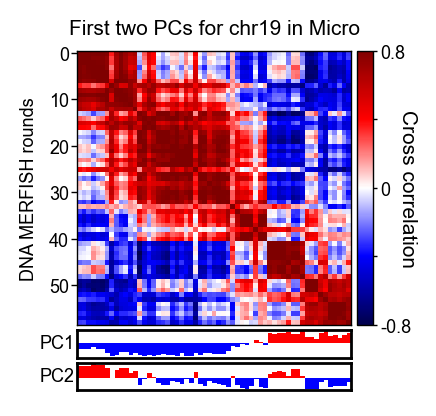

meta NOT subset; don't know how to subset; dropped


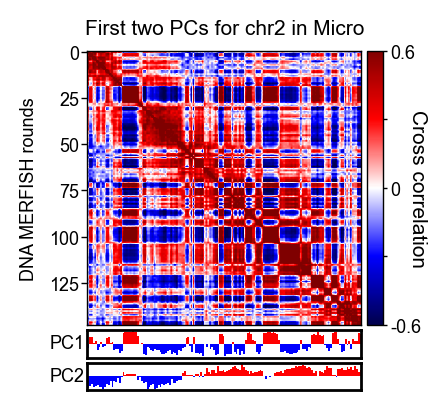

meta NOT subset; don't know how to subset; dropped


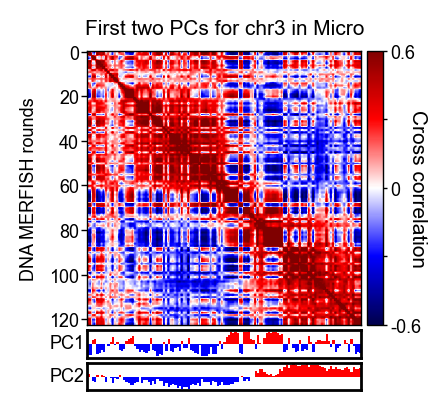

meta NOT subset; don't know how to subset; dropped


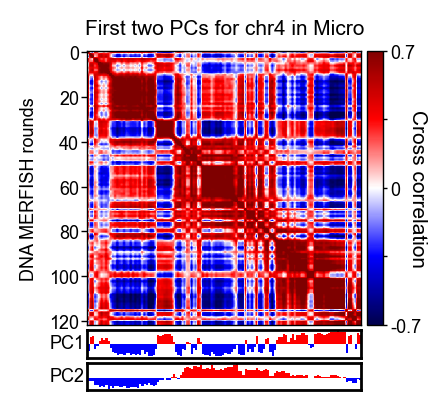

meta NOT subset; don't know how to subset; dropped


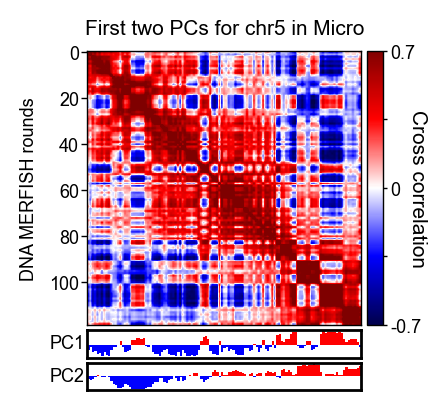

meta NOT subset; don't know how to subset; dropped


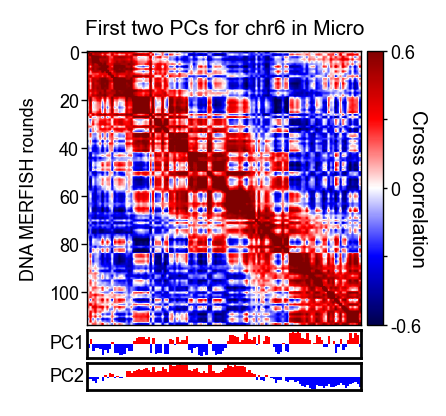

meta NOT subset; don't know how to subset; dropped


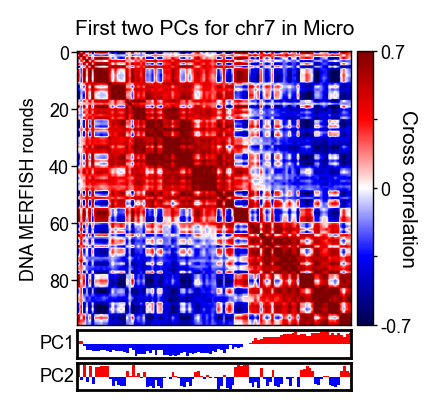

meta NOT subset; don't know how to subset; dropped


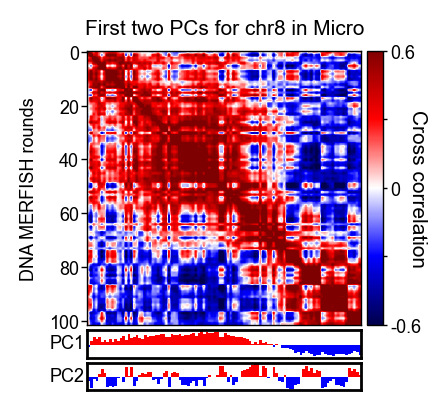

meta NOT subset; don't know how to subset; dropped


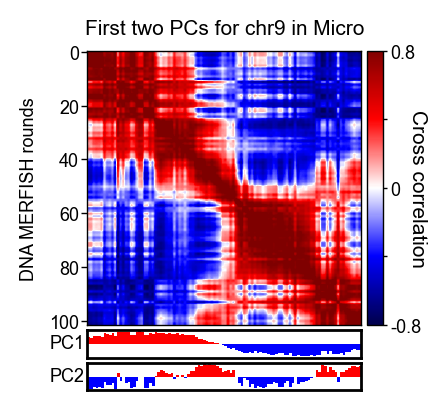

meta NOT subset; don't know how to subset; dropped


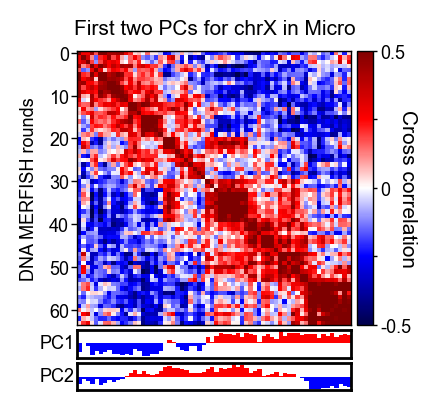

meta NOT subset; don't know how to subset; dropped


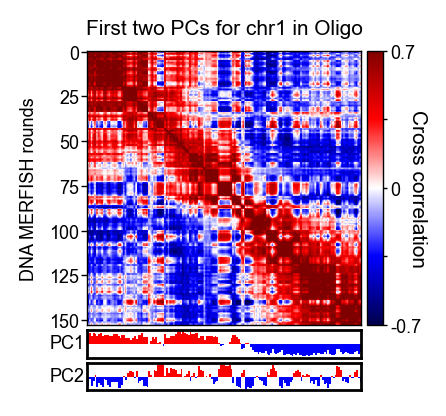

meta NOT subset; don't know how to subset; dropped


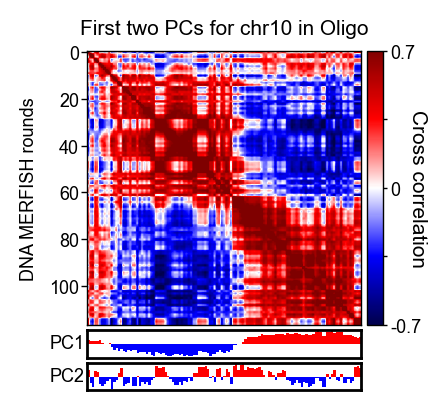

meta NOT subset; don't know how to subset; dropped


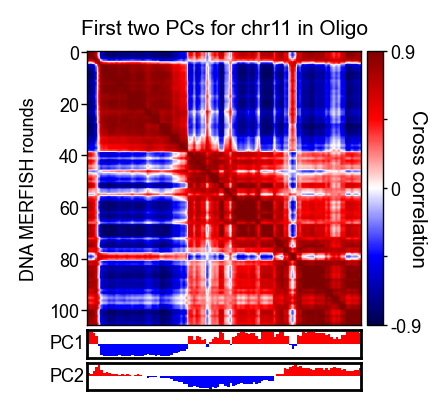

meta NOT subset; don't know how to subset; dropped


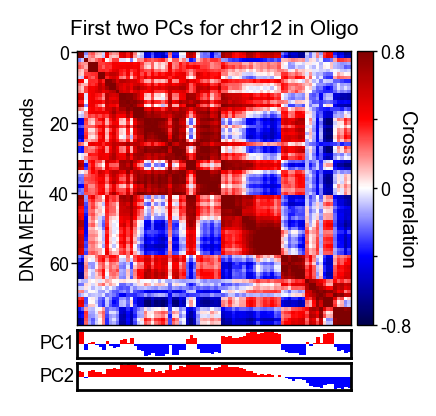

meta NOT subset; don't know how to subset; dropped


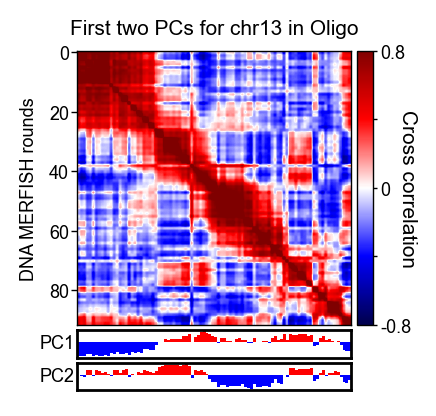

meta NOT subset; don't know how to subset; dropped


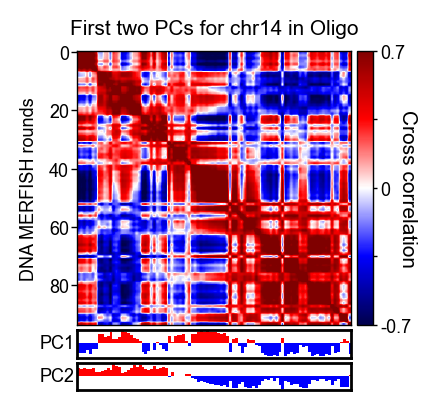

meta NOT subset; don't know how to subset; dropped


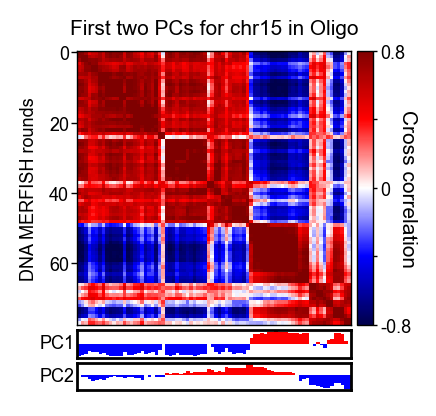

meta NOT subset; don't know how to subset; dropped


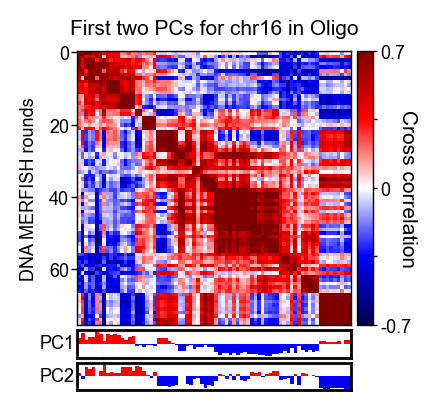

meta NOT subset; don't know how to subset; dropped


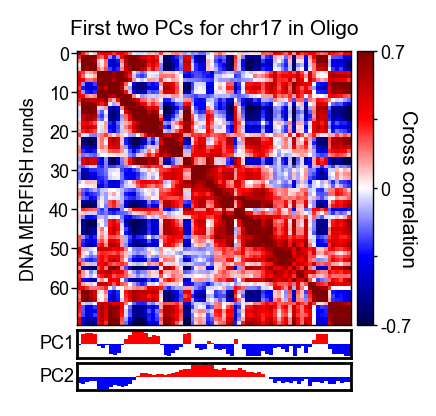

meta NOT subset; don't know how to subset; dropped


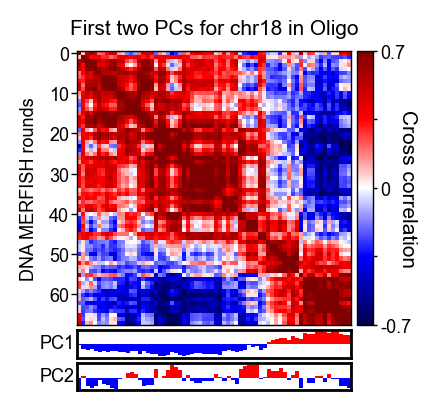

meta NOT subset; don't know how to subset; dropped


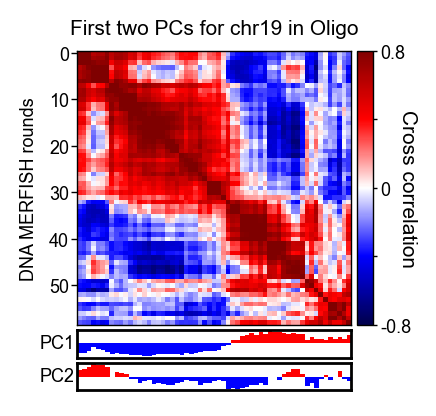

meta NOT subset; don't know how to subset; dropped


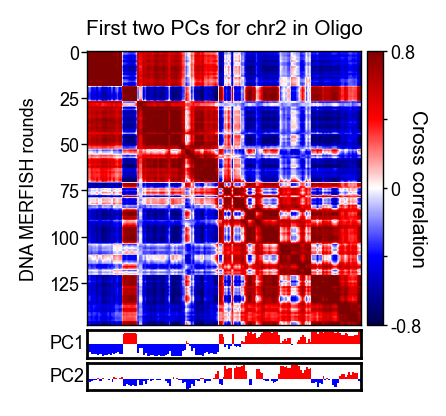

meta NOT subset; don't know how to subset; dropped


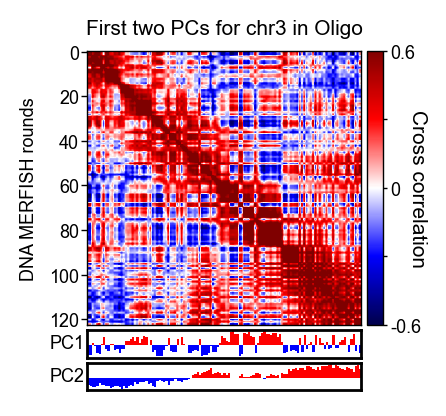

meta NOT subset; don't know how to subset; dropped


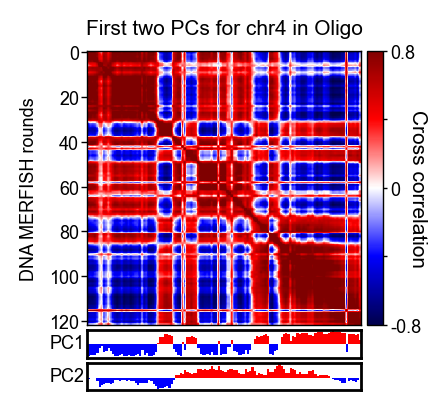

meta NOT subset; don't know how to subset; dropped


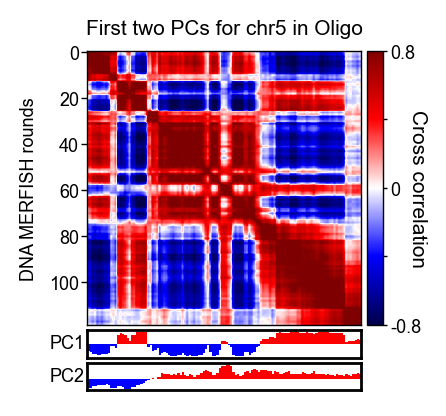

meta NOT subset; don't know how to subset; dropped


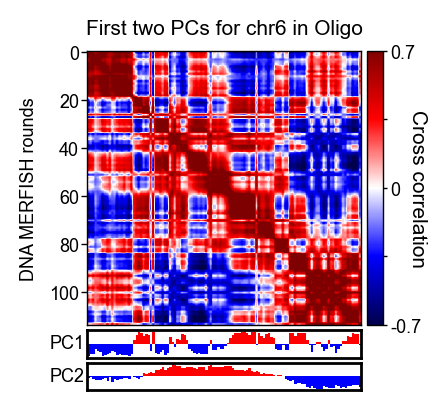

meta NOT subset; don't know how to subset; dropped


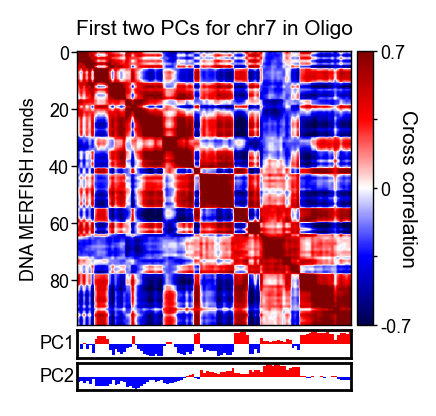

meta NOT subset; don't know how to subset; dropped


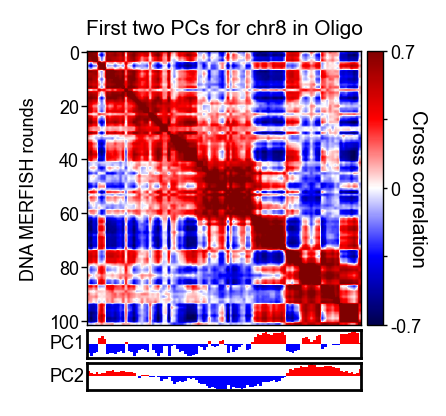

meta NOT subset; don't know how to subset; dropped


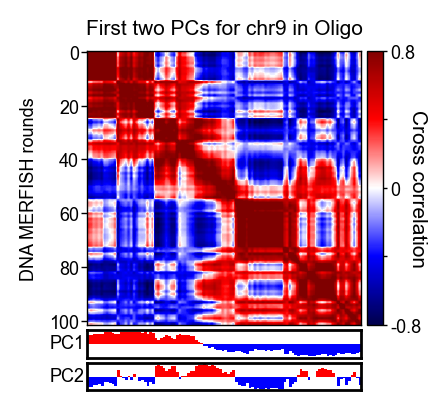

meta NOT subset; don't know how to subset; dropped


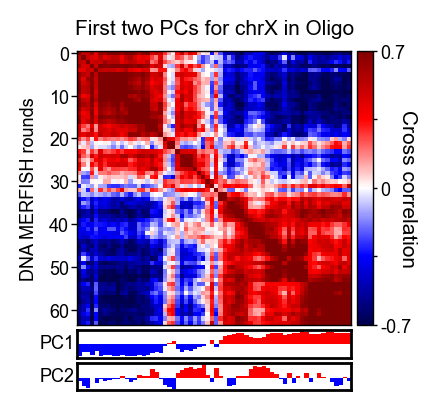

In [10]:
for (cls, chrom) in dict_corrmaps.keys():
    if cls!='Endo':
        dict_pc_corr_info['majorType'].append(cls)
        dict_pc_corr_info['chr'].append(chrom)

        mCH = df_mCH.loc[(df_mCH['chr']==chrom), cls].values
        mCG = df_mCG.loc[(df_mCG['chr']==chrom), cls].values
        RNA = df_RNA.loc[(df_RNA['chr']==chrom), cls].values
        ATAC = df_ATAC.loc[(df_ATAC['chr']==chrom), cls].values

        figure_subfolder = os.path.join(figure_folder, chrom)
        if not os.path.exists(figure_subfolder):
            os.mkdir(figure_subfolder)
        figure_name = os.path.join(figure_subfolder, f'{cls}_{chrom}_twoPCs.pdf')

        corr_map = dict_corrmaps[(cls, chrom)][-1]

        pca = PCA(3)
        pca.fit(corr_map)
        pc1 = pca.components_[0]
        norm_pc1 = pc1 / np.std(pc1)
        pc2 = pca.components_[1]
        norm_pc2 = pc2 / np.std(pc2)
        
        # determine which epigenetic feature to use
        epigenetic_info = ATAC
        
        # figure out the sign of the pc based on specific compartment figures
        compartment_pc = df_compartment_pc[(df_compartment_pc.majorType==cls)&(df_compartment_pc.chr==chrom)].compartment_pc.values[0]
        if compartment_pc==1:
            if determine_sign_switching_for_compartment_pc(norm_pc1, epigenetic_info):
                norm_pc1 *= -1
            if determine_sign_switching_for_non_compartment_pc(norm_pc2, norm_pc1):
                norm_pc2 *= -1
        elif compartment_pc==2:
            if determine_sign_switching_for_compartment_pc(norm_pc2, epigenetic_info):
                norm_pc2 *= -1
            if determine_sign_switching_for_non_compartment_pc(norm_pc1, norm_pc2):
                norm_pc1 *= -1
        
        dict_pc_corr_info['pc1'].append(norm_pc1)
        dict_pc_corr_info['pc2'].append(norm_pc2)
        dict_pc_corr_info['pc1_explained_ratio'].append(pca.explained_variance_ratio_[0])
        dict_pc_corr_info['pc2_explained_ratio'].append(pca.explained_variance_ratio_[1])

        pc1_mCH_p, pc1_mCH_r = pearsonr(norm_pc1, mCH)
        pc1_mCG_p, pc1_mCG_r = pearsonr(norm_pc1, mCG)
        pc2_mCH_p, pc2_mCH_r = pearsonr(norm_pc2, mCH)
        pc2_mCG_p, pc2_mCG_r = pearsonr(norm_pc2, mCG)
        pc1_RNA_p, pc1_RNA_r = pearsonr(norm_pc1, RNA)
        pc1_ATAC_p, pc1_ATAC_r = pearsonr(norm_pc1, ATAC)
        pc2_RNA_p, pc2_RNA_r = pearsonr(norm_pc2, RNA)
        pc2_ATAC_p, pc2_ATAC_r = pearsonr(norm_pc2, ATAC)

        dict_pc_corr_info['pc1_mCH_p'].append(pc1_mCH_p)
        dict_pc_corr_info['pc1_mCH_r'].append(pc1_mCH_r)
        dict_pc_corr_info['pc1_mCG_p'].append(pc1_mCG_p)
        dict_pc_corr_info['pc1_mCG_r'].append(pc1_mCG_r)
        dict_pc_corr_info['pc2_mCH_p'].append(pc2_mCH_p)
        dict_pc_corr_info['pc2_mCH_r'].append(pc2_mCH_r)
        dict_pc_corr_info['pc2_mCG_p'].append(pc2_mCG_p)
        dict_pc_corr_info['pc2_mCG_r'].append(pc2_mCG_r)
        dict_pc_corr_info['pc1_RNA_p'].append(pc1_RNA_p)
        dict_pc_corr_info['pc1_RNA_r'].append(pc1_RNA_r)
        dict_pc_corr_info['pc1_ATAC_p'].append(pc1_ATAC_p)
        dict_pc_corr_info['pc1_ATAC_r'].append(pc1_ATAC_r)
        dict_pc_corr_info['pc2_RNA_p'].append(pc2_RNA_p)
        dict_pc_corr_info['pc2_RNA_r'].append(pc2_RNA_r)
        dict_pc_corr_info['pc2_ATAC_p'].append(pc2_ATAC_p)
        dict_pc_corr_info['pc2_ATAC_r'].append(pc2_ATAC_r)

        matrix_plot.plot_cross_correlation_map_with_first_two_PCs(corr_map, norm_pc1, norm_pc2,
                                                                  cell_type=cls, chrom=chrom, 
                                                                  save_fig=True, figure_file=figure_name)

In [11]:
pickle.dump(dict_pc_corr_info,open(r'E:\DNA_analysis\Postanalysis_WT_MoP\AB_calling_twoPCs\pc_correlation_summary.pkl','wb'))

In [12]:
df_pc_corr_info = pd.DataFrame(dict_pc_corr_info)
df_pc_corr_info

,majorType,chr,pc1,pc2,pc1_mCH_p,pc1_mCH_r,pc1_mCG_p,pc1_mCG_r,pc2_mCH_p,pc2_mCH_r,...,pc1_RNA_p,pc1_RNA_r,pc1_ATAC_p,pc1_ATAC_r,pc2_RNA_p,pc2_RNA_r,pc2_ATAC_p,pc2_ATAC_r,pc1_explained_ratio,pc2_explained_ratio
0,Gluta,chr1,"[-1.0720360862008338, -1.005786500051724, -1.0...","[-0.8664122176491365, -0.4070351840126995, -0....",0.279210,4.739028e-04,-0.536864,8.454680e-13,0.257373,1.319529e-03,...,0.248944,1.915555e-03,0.567598,2.002877e-14,-0.332172,2.731301e-05,-0.251292,1.728789e-03,0.790180,0.076719
1,Gluta,chr10,"[0.5585033981806027, 0.9543220269349257, -0.22...","[-0.9531319383599042, -1.6853060340730017, -1....",-0.184835,4.603705e-02,-0.503318,7.301297e-09,-0.072260,4.387955e-01,...,0.166968,7.197226e-02,0.142010,1.266782e-01,0.184904,4.595424e-02,-0.015527,8.680339e-01,0.666801,0.128990
2,Gluta,chr11,"[1.1789667457104007, 1.2082407857429383, 1.155...","[0.7077111345015118, 0.30297237046342496, 0.00...",-0.397955,2.395048e-05,-0.765010,1.352895e-21,-0.446415,1.615453e-06,...,0.621628,1.153008e-12,0.195841,4.422808e-02,0.087361,3.732094e-01,-0.318086,8.911573e-04,0.955323,0.018801
3,Gluta,chr12,"[0.9829474246362359, 1.0288891587389526, -0.59...","[-1.6399677964409622, -1.7984604309492263, -1....",-0.059915,6.023085e-01,-0.649362,1.267467e-10,-0.119969,2.954613e-01,...,0.427939,9.298827e-05,0.416254,1.503739e-04,0.298372,7.970019e-03,0.002003,9.861171e-01,0.877071,0.052499
4,Gluta,chr13,"[-1.0591796380580438, -1.140521447764145, -1.0...","[-1.4051407294666807, -1.335000204253381, -1.4...",0.390778,1.175026e-04,-0.224382,3.153373e-02,0.001570,9.881497e-01,...,0.469154,2.390712e-06,0.677133,1.256378e-13,-0.143720,1.716962e-01,-0.040193,7.036451e-01,0.790589,0.114113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Oligo,chr6,"[-1.4938708999004842, -1.2357605632256425, -1....","[-0.2434770886668152, -0.17275295034117186, -0...",0.645503,8.960165e-15,-0.250989,7.069494e-03,-0.045572,6.301891e-01,...,0.573608,2.545727e-11,0.715270,3.883322e-19,0.095001,3.146889e-01,-0.051847,5.837999e-01,0.541597,0.378556
96,Oligo,chr7,"[0.01397869860969108, -0.623898443892481, 0.09...","[-0.6964677514728157, -0.5242694251210013, -0....",0.331464,9.706123e-04,-0.211012,3.904595e-02,0.439739,7.371066e-06,...,0.464790,1.836175e-06,0.525367,3.890689e-08,-0.183692,7.321132e-02,0.088934,3.888706e-01,0.711772,0.150292
97,Oligo,chr8,"[-1.2194446930922265, -1.572423406027938, -1.1...","[0.7782679203134713, 0.46957293339047046, 0.32...",0.622142,2.960193e-12,-0.314049,1.307281e-03,0.144137,1.483650e-01,...,0.271964,5.689272e-03,0.653224,9.983578e-14,-0.033872,7.353841e-01,0.014957,8.813891e-01,0.597593,0.287103
98,Oligo,chr9,"[1.0502918060255526, 0.9974015897621459, 1.106...","[-1.2316171325762046, -1.2645794496127858, -1....",-0.041613,6.779409e-01,0.096776,3.332347e-01,0.553040,1.665183e-09,...,-0.168175,9.110331e-02,-0.135483,1.745547e-01,0.710357,6.205155e-17,0.651276,1.249019e-13,0.553465,0.407684


In [13]:
df_pc_corr_info.to_csv(r'E:\DNA_analysis\Postanalysis_WT_MoP\AB_calling_twoPCs\pc_correlation_summary.csv')